In [1]:
!pip install opendatasets --upgrade --quiet

import opendatasets as od

dataset_url = 'https://www.kaggle.com/srrrrr/photo2cartoon'
od.download(dataset_url)



Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: shailysarker
Your Kaggle Key: ··········


  0%|          | 0.00/91.6M [00:00<?, ?B/s]

100%|██████████| 91.6M/91.6M [00:03<00:00, 31.4MB/s]

In [2]:
import os

DATA_DIR = '/content/photo2cartoon'
print(os.listdir(DATA_DIR))

['photo2cartoon']


In [3]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T


image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)


train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


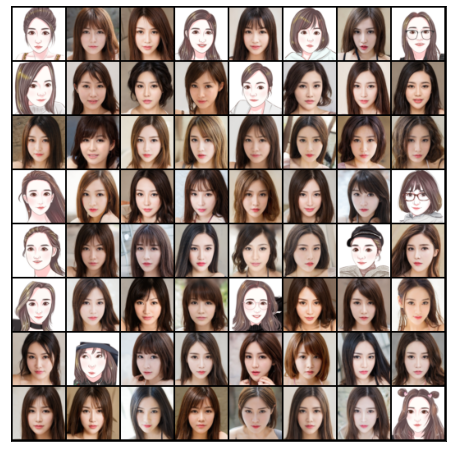

In [4]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline


def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]


def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break


show_batch(train_dl)

In [5]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [6]:
device = get_default_device()
device

device(type='cuda')

In [7]:
train_dl = DeviceDataLoader(train_dl, device)

In [8]:
import torch.nn as nn



discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [9]:
discriminator = to_device(discriminator, device)

In [10]:
latent_size = 128



generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


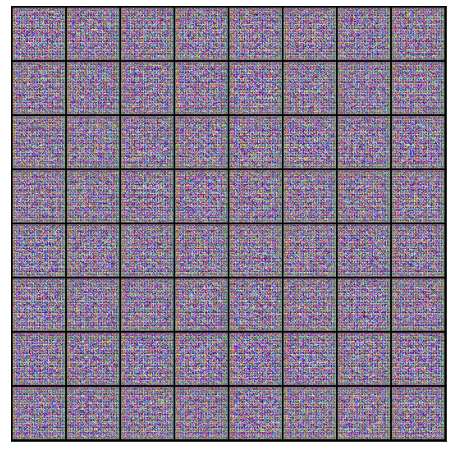

In [11]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [12]:
generator = to_device(generator, device)

In [13]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [14]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [15]:
from torchvision.utils import save_image


sample_dir = 'Photo2Cartoon_generated'
os.makedirs(sample_dir, exist_ok=True)


def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


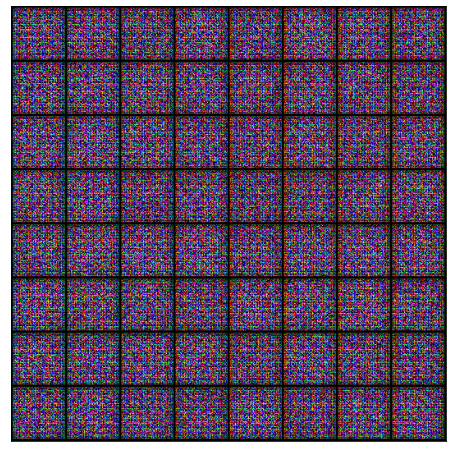

In [16]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

save_samples(0, fixed_latent)

In [17]:
from tqdm.notebook import tqdm
import torch.nn.functional as F



def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [18]:
lr = 0.0001
epochs = 500


history = fit(epochs, lr)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Epoch [1/500], loss_g: 4.6156, loss_d: 0.0789, real_score: 0.9849, fake_score: 0.0612
Saving generated-images-0001.png



Epoch [2/500], loss_g: 5.6078, loss_d: 0.0395, real_score: 0.9885, fake_score: 0.0269
Saving generated-images-0002.png



Epoch [3/500], loss_g: 6.1412, loss_d: 0.0348, real_score: 0.9848, fake_score: 0.0167
Saving generated-images-0003.png



Epoch [4/500], loss_g: 6.7186, loss_d: 0.0340, real_score: 0.9813, fake_score: 0.0117
Saving generated-images-0004.png



Epoch [5/500], loss_g: 6.9692, loss_d: 0.0158, real_score: 0.9979, fake_score: 0.0136
Saving generated-images-0005.png



Epoch [6/500], loss_g: 7.1195, loss_d: 0.0140, real_score: 0.9941, fake_score: 0.0080
Saving generated-images-0006.png



Epoch [7/500], loss_g: 6.9422, loss_d: 0.0186, real_score: 0.9897, fake_score: 0.0078
Saving generated-images-0007.png



Epoch [8/500], loss_g: 7.5553, loss_d: 0.0091, real_score: 0.9989, fake_score: 0.0079
Saving generated-images-0008.png



Epoch [9/500], loss_g: 7.2703, loss_d: 0.0171, real_score: 0.9889, fake_score: 0.0057
Saving generated-images-0009.png



Epoch [10/500], loss_g: 7.7176, loss_d: 0.0054, real_score: 0.9990, fake_score: 0.0044
Saving generated-images-0010.png



Epoch [11/500], loss_g: 7.6871, loss_d: 0.0072, real_score: 0.9971, fake_score: 0.0043
Saving generated-images-0011.png



Epoch [12/500], loss_g: 7.6551, loss_d: 0.0056, real_score: 0.9982, fake_score: 0.0037
Saving generated-images-0012.png



Epoch [13/500], loss_g: 7.6937, loss_d: 0.0050, real_score: 0.9981, fake_score: 0.0031
Saving generated-images-0013.png



Epoch [14/500], loss_g: 7.9013, loss_d: 0.0039, real_score: 0.9997, fake_score: 0.0037
Saving generated-images-0014.png



Epoch [15/500], loss_g: 7.4467, loss_d: 0.0087, real_score: 0.9945, fake_score: 0.0029
Saving generated-images-0015.png



Epoch [16/500], loss_g: 7.5258, loss_d: 0.0077, real_score: 0.9951, fake_score: 0.0025
Saving generated-images-0016.png



Epoch [17/500], loss_g: 7.4386, loss_d: 0.0135, real_score: 0.9895, fake_score: 0.0023
Saving generated-images-0017.png



Epoch [18/500], loss_g: 7.9346, loss_d: 0.0053, real_score: 0.9967, fake_score: 0.0019
Saving generated-images-0018.png



Epoch [19/500], loss_g: 8.0387, loss_d: 0.0022, real_score: 0.9997, fake_score: 0.0020
Saving generated-images-0019.png



Epoch [20/500], loss_g: 7.9491, loss_d: 0.0030, real_score: 0.9986, fake_score: 0.0016
Saving generated-images-0020.png



Epoch [21/500], loss_g: 7.6886, loss_d: 0.0052, real_score: 0.9963, fake_score: 0.0014
Saving generated-images-0021.png



Epoch [22/500], loss_g: 8.1512, loss_d: 0.0013, real_score: 0.9998, fake_score: 0.0011
Saving generated-images-0022.png



Epoch [23/500], loss_g: 7.9691, loss_d: 0.0019, real_score: 0.9997, fake_score: 0.0016
Saving generated-images-0023.png



Epoch [24/500], loss_g: 8.1164, loss_d: 0.0012, real_score: 0.9998, fake_score: 0.0010
Saving generated-images-0024.png



Epoch [25/500], loss_g: 8.2123, loss_d: 0.0014, real_score: 1.0000, fake_score: 0.0014
Saving generated-images-0025.png



Epoch [26/500], loss_g: 7.8812, loss_d: 0.0029, real_score: 0.9981, fake_score: 0.0010
Saving generated-images-0026.png



Epoch [27/500], loss_g: 7.9419, loss_d: 0.0026, real_score: 0.9984, fake_score: 0.0010
Saving generated-images-0027.png



Epoch [28/500], loss_g: 7.8871, loss_d: 0.0031, real_score: 0.9977, fake_score: 0.0008
Saving generated-images-0028.png



Epoch [29/500], loss_g: 8.0192, loss_d: 0.0017, real_score: 0.9991, fake_score: 0.0008
Saving generated-images-0029.png



Epoch [30/500], loss_g: 8.0537, loss_d: 0.0012, real_score: 0.9996, fake_score: 0.0008
Saving generated-images-0030.png



Epoch [31/500], loss_g: 8.4370, loss_d: 0.0008, real_score: 0.9995, fake_score: 0.0004
Saving generated-images-0031.png



Epoch [32/500], loss_g: 8.2459, loss_d: 0.0009, real_score: 0.9999, fake_score: 0.0008
Saving generated-images-0032.png



Epoch [33/500], loss_g: 8.2009, loss_d: 0.0012, real_score: 0.9994, fake_score: 0.0006
Saving generated-images-0033.png



Epoch [34/500], loss_g: 8.4171, loss_d: 0.0006, real_score: 0.9999, fake_score: 0.0004
Saving generated-images-0034.png



Epoch [35/500], loss_g: 8.2956, loss_d: 0.0009, real_score: 0.9996, fake_score: 0.0005
Saving generated-images-0035.png



Epoch [36/500], loss_g: 7.8101, loss_d: 0.0027, real_score: 0.9980, fake_score: 0.0006
Saving generated-images-0036.png



Epoch [37/500], loss_g: 8.2809, loss_d: 0.0008, real_score: 0.9999, fake_score: 0.0008
Saving generated-images-0037.png



Epoch [38/500], loss_g: 8.3155, loss_d: 0.0010, real_score: 0.9996, fake_score: 0.0006
Saving generated-images-0038.png



Epoch [39/500], loss_g: 8.3298, loss_d: 0.0012, real_score: 0.9992, fake_score: 0.0004
Saving generated-images-0039.png



Epoch [40/500], loss_g: 8.4256, loss_d: 0.0006, real_score: 0.9998, fake_score: 0.0005
Saving generated-images-0040.png



Epoch [41/500], loss_g: 8.4087, loss_d: 0.0016, real_score: 0.9988, fake_score: 0.0004
Saving generated-images-0041.png



Epoch [42/500], loss_g: 8.5445, loss_d: 0.0004, real_score: 0.9999, fake_score: 0.0004
Saving generated-images-0042.png



Epoch [43/500], loss_g: 8.3130, loss_d: 0.0012, real_score: 0.9992, fake_score: 0.0004
Saving generated-images-0043.png



Epoch [44/500], loss_g: 8.6247, loss_d: 0.0004, real_score: 0.9999, fake_score: 0.0003
Saving generated-images-0044.png



Epoch [45/500], loss_g: 8.6275, loss_d: 0.0004, real_score: 0.9999, fake_score: 0.0003
Saving generated-images-0045.png



Epoch [46/500], loss_g: 8.7335, loss_d: 0.0003, real_score: 0.9999, fake_score: 0.0002
Saving generated-images-0046.png



Epoch [47/500], loss_g: 8.5424, loss_d: 0.0006, real_score: 0.9998, fake_score: 0.0004
Saving generated-images-0047.png



Epoch [48/500], loss_g: 8.6271, loss_d: 0.0004, real_score: 0.9999, fake_score: 0.0003
Saving generated-images-0048.png



Epoch [49/500], loss_g: 8.8339, loss_d: 0.0004, real_score: 0.9998, fake_score: 0.0003
Saving generated-images-0049.png



Epoch [50/500], loss_g: 8.7941, loss_d: 0.0003, real_score: 0.9999, fake_score: 0.0003
Saving generated-images-0050.png



Epoch [51/500], loss_g: 8.8463, loss_d: 0.0003, real_score: 0.9999, fake_score: 0.0003
Saving generated-images-0051.png



Epoch [52/500], loss_g: 8.7904, loss_d: 0.0004, real_score: 0.9999, fake_score: 0.0003
Saving generated-images-0052.png



Epoch [53/500], loss_g: 8.7129, loss_d: 0.0003, real_score: 1.0000, fake_score: 0.0003
Saving generated-images-0053.png



Epoch [54/500], loss_g: 8.7217, loss_d: 0.0006, real_score: 0.9997, fake_score: 0.0003
Saving generated-images-0054.png



Epoch [55/500], loss_g: 8.7090, loss_d: 0.0010, real_score: 0.9992, fake_score: 0.0002
Saving generated-images-0055.png



Epoch [56/500], loss_g: 8.6972, loss_d: 0.0004, real_score: 0.9999, fake_score: 0.0003
Saving generated-images-0056.png



Epoch [57/500], loss_g: 8.8555, loss_d: 0.0004, real_score: 0.9998, fake_score: 0.0003
Saving generated-images-0057.png



Epoch [58/500], loss_g: 8.9076, loss_d: 0.0004, real_score: 0.9999, fake_score: 0.0003
Saving generated-images-0058.png



Epoch [59/500], loss_g: 5.2088, loss_d: 0.0033, real_score: 0.9970, fake_score: 0.0002
Saving generated-images-0059.png



Epoch [60/500], loss_g: 7.2716, loss_d: 0.0770, real_score: 0.9402, fake_score: 0.0052
Saving generated-images-0060.png



Epoch [61/500], loss_g: 11.1324, loss_d: 0.0003, real_score: 0.9997, fake_score: 0.0000
Saving generated-images-0061.png



Epoch [62/500], loss_g: 8.3063, loss_d: 0.0017, real_score: 0.9996, fake_score: 0.0012
Saving generated-images-0062.png



Epoch [63/500], loss_g: 11.0976, loss_d: 0.0448, real_score: 0.9587, fake_score: 0.0000
Saving generated-images-0063.png



Epoch [64/500], loss_g: 18.0764, loss_d: 0.0080, real_score: 0.9925, fake_score: 0.0000
Saving generated-images-0064.png



Epoch [65/500], loss_g: 7.7862, loss_d: 0.0550, real_score: 0.9979, fake_score: 0.0509
Saving generated-images-0065.png



Epoch [66/500], loss_g: 6.0222, loss_d: 0.0128, real_score: 0.9948, fake_score: 0.0074
Saving generated-images-0066.png



Epoch [67/500], loss_g: 6.4586, loss_d: 0.0464, real_score: 0.9993, fake_score: 0.0444
Saving generated-images-0067.png



Epoch [68/500], loss_g: 7.5251, loss_d: 0.0166, real_score: 0.9986, fake_score: 0.0151
Saving generated-images-0068.png



Epoch [69/500], loss_g: 8.5514, loss_d: 0.0090, real_score: 0.9953, fake_score: 0.0042
Saving generated-images-0069.png



Epoch [70/500], loss_g: 7.4147, loss_d: 0.0182, real_score: 0.9947, fake_score: 0.0126
Saving generated-images-0070.png



Epoch [71/500], loss_g: 6.6140, loss_d: 0.0094, real_score: 0.9961, fake_score: 0.0053
Saving generated-images-0071.png



Epoch [72/500], loss_g: 7.2666, loss_d: 0.0103, real_score: 0.9913, fake_score: 0.0012
Saving generated-images-0072.png



Epoch [73/500], loss_g: 6.7059, loss_d: 0.0113, real_score: 0.9949, fake_score: 0.0060
Saving generated-images-0073.png



Epoch [74/500], loss_g: 6.9426, loss_d: 0.0050, real_score: 0.9981, fake_score: 0.0032
Saving generated-images-0074.png



Epoch [75/500], loss_g: 6.9189, loss_d: 0.0061, real_score: 0.9976, fake_score: 0.0037
Saving generated-images-0075.png



Epoch [76/500], loss_g: 6.8795, loss_d: 0.0051, real_score: 0.9974, fake_score: 0.0024
Saving generated-images-0076.png



Epoch [77/500], loss_g: 6.8252, loss_d: 0.0029, real_score: 0.9992, fake_score: 0.0020
Saving generated-images-0077.png



Epoch [78/500], loss_g: 6.7747, loss_d: 0.0029, real_score: 0.9997, fake_score: 0.0025
Saving generated-images-0078.png



Epoch [79/500], loss_g: 6.9548, loss_d: 0.0052, real_score: 0.9963, fake_score: 0.0014
Saving generated-images-0079.png



Epoch [80/500], loss_g: 7.0402, loss_d: 0.0022, real_score: 0.9991, fake_score: 0.0013
Saving generated-images-0080.png



Epoch [81/500], loss_g: 6.9709, loss_d: 0.0029, real_score: 0.9999, fake_score: 0.0028
Saving generated-images-0081.png



Epoch [82/500], loss_g: 7.2755, loss_d: 0.0025, real_score: 0.9985, fake_score: 0.0011
Saving generated-images-0082.png



Epoch [83/500], loss_g: 7.2546, loss_d: 0.0045, real_score: 0.9966, fake_score: 0.0010
Saving generated-images-0083.png



Epoch [84/500], loss_g: 7.2420, loss_d: 0.0019, real_score: 0.9994, fake_score: 0.0013
Saving generated-images-0084.png



Epoch [85/500], loss_g: 7.1630, loss_d: 0.0020, real_score: 0.9997, fake_score: 0.0017
Saving generated-images-0085.png



Epoch [86/500], loss_g: 7.8931, loss_d: 0.0012, real_score: 0.9994, fake_score: 0.0006
Saving generated-images-0086.png



Epoch [87/500], loss_g: 7.6891, loss_d: 0.0012, real_score: 0.9996, fake_score: 0.0008
Saving generated-images-0087.png



Epoch [88/500], loss_g: 7.7596, loss_d: 0.0017, real_score: 0.9989, fake_score: 0.0006
Saving generated-images-0088.png



Epoch [89/500], loss_g: 7.6136, loss_d: 0.0018, real_score: 0.9989, fake_score: 0.0007
Saving generated-images-0089.png



Epoch [90/500], loss_g: 7.9764, loss_d: 0.0007, real_score: 0.9998, fake_score: 0.0005
Saving generated-images-0090.png



Epoch [91/500], loss_g: 7.6586, loss_d: 0.0009, real_score: 0.9999, fake_score: 0.0008
Saving generated-images-0091.png



Epoch [92/500], loss_g: 7.8209, loss_d: 0.0007, real_score: 0.9999, fake_score: 0.0005
Saving generated-images-0092.png



Epoch [93/500], loss_g: 7.4331, loss_d: 0.0019, real_score: 0.9990, fake_score: 0.0009
Saving generated-images-0093.png



Epoch [94/500], loss_g: 7.6050, loss_d: 0.0008, real_score: 0.9999, fake_score: 0.0008
Saving generated-images-0094.png



Epoch [95/500], loss_g: 7.7599, loss_d: 0.0014, real_score: 0.9992, fake_score: 0.0005
Saving generated-images-0095.png



Epoch [96/500], loss_g: 7.8149, loss_d: 0.0008, real_score: 0.9997, fake_score: 0.0005
Saving generated-images-0096.png



Epoch [97/500], loss_g: 8.0047, loss_d: 0.0006, real_score: 0.9998, fake_score: 0.0004
Saving generated-images-0097.png



Epoch [98/500], loss_g: 7.6254, loss_d: 0.0018, real_score: 0.9989, fake_score: 0.0006
Saving generated-images-0098.png



Epoch [99/500], loss_g: 7.4016, loss_d: 0.0013, real_score: 0.9996, fake_score: 0.0009
Saving generated-images-0099.png



Epoch [100/500], loss_g: 7.6392, loss_d: 0.0024, real_score: 0.9981, fake_score: 0.0005
Saving generated-images-0100.png



Epoch [101/500], loss_g: 8.0580, loss_d: 0.0008, real_score: 0.9996, fake_score: 0.0004
Saving generated-images-0101.png



Epoch [102/500], loss_g: 8.0448, loss_d: 0.0006, real_score: 0.9998, fake_score: 0.0004
Saving generated-images-0102.png



Epoch [103/500], loss_g: 8.2757, loss_d: 0.0007, real_score: 0.9996, fake_score: 0.0003
Saving generated-images-0103.png



Epoch [104/500], loss_g: 8.1109, loss_d: 0.0009, real_score: 0.9995, fake_score: 0.0004
Saving generated-images-0104.png



Epoch [105/500], loss_g: 7.9177, loss_d: 0.0006, real_score: 0.9999, fake_score: 0.0005
Saving generated-images-0105.png



Epoch [106/500], loss_g: 8.3407, loss_d: 0.0006, real_score: 0.9997, fake_score: 0.0003
Saving generated-images-0106.png



Epoch [107/500], loss_g: 8.6492, loss_d: 0.0007, real_score: 0.9995, fake_score: 0.0002
Saving generated-images-0107.png



Epoch [108/500], loss_g: 8.6670, loss_d: 0.0003, real_score: 0.9999, fake_score: 0.0002
Saving generated-images-0108.png



Epoch [109/500], loss_g: 8.4339, loss_d: 0.0003, real_score: 1.0000, fake_score: 0.0002
Saving generated-images-0109.png



Epoch [110/500], loss_g: 8.2233, loss_d: 0.0006, real_score: 0.9997, fake_score: 0.0003
Saving generated-images-0110.png



Epoch [111/500], loss_g: 7.9507, loss_d: 0.0005, real_score: 0.9999, fake_score: 0.0004
Saving generated-images-0111.png



Epoch [112/500], loss_g: 8.0381, loss_d: 0.0005, real_score: 0.9999, fake_score: 0.0004
Saving generated-images-0112.png



Epoch [113/500], loss_g: 8.3738, loss_d: 0.0004, real_score: 0.9998, fake_score: 0.0003
Saving generated-images-0113.png



Epoch [114/500], loss_g: 8.3437, loss_d: 0.0006, real_score: 0.9996, fake_score: 0.0003
Saving generated-images-0114.png



Epoch [115/500], loss_g: 8.1377, loss_d: 0.0007, real_score: 0.9996, fake_score: 0.0003
Saving generated-images-0115.png



Epoch [116/500], loss_g: 8.0772, loss_d: 0.0004, real_score: 1.0000, fake_score: 0.0004
Saving generated-images-0116.png



Epoch [117/500], loss_g: 8.1112, loss_d: 0.0006, real_score: 0.9998, fake_score: 0.0003
Saving generated-images-0117.png



Epoch [118/500], loss_g: 8.4583, loss_d: 0.0003, real_score: 0.9999, fake_score: 0.0002
Saving generated-images-0118.png



Epoch [119/500], loss_g: 8.1021, loss_d: 0.0005, real_score: 0.9998, fake_score: 0.0004
Saving generated-images-0119.png



Epoch [120/500], loss_g: 8.5274, loss_d: 0.0005, real_score: 0.9997, fake_score: 0.0002
Saving generated-images-0120.png



Epoch [121/500], loss_g: 8.2250, loss_d: 0.0004, real_score: 0.9999, fake_score: 0.0003
Saving generated-images-0121.png



Epoch [122/500], loss_g: 8.4969, loss_d: 0.0002, real_score: 1.0000, fake_score: 0.0002
Saving generated-images-0122.png



Epoch [123/500], loss_g: 8.7302, loss_d: 0.0004, real_score: 0.9998, fake_score: 0.0002
Saving generated-images-0123.png



Epoch [124/500], loss_g: 8.4093, loss_d: 0.0015, real_score: 0.9987, fake_score: 0.0002
Saving generated-images-0124.png



Epoch [125/500], loss_g: 8.4568, loss_d: 0.0003, real_score: 1.0000, fake_score: 0.0002
Saving generated-images-0125.png



Epoch [126/500], loss_g: 8.5198, loss_d: 0.0003, real_score: 1.0000, fake_score: 0.0002
Saving generated-images-0126.png



Epoch [127/500], loss_g: 8.5802, loss_d: 0.0003, real_score: 1.0000, fake_score: 0.0002
Saving generated-images-0127.png



Epoch [128/500], loss_g: 8.7047, loss_d: 0.0002, real_score: 1.0000, fake_score: 0.0002
Saving generated-images-0128.png



Epoch [129/500], loss_g: 8.6135, loss_d: 0.0002, real_score: 1.0000, fake_score: 0.0002
Saving generated-images-0129.png



Epoch [130/500], loss_g: 8.3662, loss_d: 0.0003, real_score: 0.9999, fake_score: 0.0003
Saving generated-images-0130.png



Epoch [131/500], loss_g: 8.6626, loss_d: 0.0005, real_score: 0.9997, fake_score: 0.0002
Saving generated-images-0131.png



Epoch [132/500], loss_g: 8.1925, loss_d: 0.0007, real_score: 0.9996, fake_score: 0.0003
Saving generated-images-0132.png



Epoch [133/500], loss_g: 8.6686, loss_d: 0.0003, real_score: 0.9999, fake_score: 0.0002
Saving generated-images-0133.png



Epoch [134/500], loss_g: 8.5752, loss_d: 0.0003, real_score: 1.0000, fake_score: 0.0002
Saving generated-images-0134.png



Epoch [135/500], loss_g: 8.2368, loss_d: 0.0010, real_score: 0.9993, fake_score: 0.0003
Saving generated-images-0135.png



Epoch [136/500], loss_g: 8.4031, loss_d: 0.0003, real_score: 1.0000, fake_score: 0.0003
Saving generated-images-0136.png



Epoch [137/500], loss_g: 8.4080, loss_d: 0.0009, real_score: 0.9994, fake_score: 0.0002
Saving generated-images-0137.png



Epoch [138/500], loss_g: 8.0867, loss_d: 0.0009, real_score: 0.9994, fake_score: 0.0003
Saving generated-images-0138.png



Epoch [139/500], loss_g: 8.2050, loss_d: 0.0004, real_score: 0.9999, fake_score: 0.0004
Saving generated-images-0139.png



Epoch [140/500], loss_g: 7.8123, loss_d: 0.0015, real_score: 0.9990, fake_score: 0.0005
Saving generated-images-0140.png



Epoch [141/500], loss_g: 6.8545, loss_d: 0.0032, real_score: 0.9977, fake_score: 0.0009
Saving generated-images-0141.png



Epoch [142/500], loss_g: 0.5275, loss_d: 7.2614, real_score: 0.0100, fake_score: 0.0000
Saving generated-images-0142.png



Epoch [143/500], loss_g: 7.2325, loss_d: 0.3684, real_score: 0.9183, fake_score: 0.1945
Saving generated-images-0143.png



Epoch [144/500], loss_g: 5.9928, loss_d: 0.1207, real_score: 0.9471, fake_score: 0.0596
Saving generated-images-0144.png



Epoch [145/500], loss_g: 8.5983, loss_d: 0.0427, real_score: 0.9604, fake_score: 0.0009
Saving generated-images-0145.png



Epoch [146/500], loss_g: 14.5666, loss_d: 0.0048, real_score: 0.9954, fake_score: 0.0000
Saving generated-images-0146.png



Epoch [147/500], loss_g: 5.0572, loss_d: 0.0629, real_score: 0.9589, fake_score: 0.0150
Saving generated-images-0147.png



Epoch [148/500], loss_g: 4.2201, loss_d: 0.1438, real_score: 0.9226, fake_score: 0.0493
Saving generated-images-0148.png



Epoch [149/500], loss_g: 3.9887, loss_d: 0.1108, real_score: 0.9340, fake_score: 0.0377
Saving generated-images-0149.png



Epoch [150/500], loss_g: 5.0495, loss_d: 0.0965, real_score: 0.9599, fake_score: 0.0477
Saving generated-images-0150.png



Epoch [151/500], loss_g: 3.9699, loss_d: 0.0937, real_score: 0.9658, fake_score: 0.0538
Saving generated-images-0151.png



Epoch [152/500], loss_g: 4.1357, loss_d: 0.1107, real_score: 0.9275, fake_score: 0.0327
Saving generated-images-0152.png



Epoch [153/500], loss_g: 9.6031, loss_d: 0.2283, real_score: 0.8320, fake_score: 0.0009
Saving generated-images-0153.png



Epoch [154/500], loss_g: 5.7083, loss_d: 0.1676, real_score: 0.9519, fake_score: 0.1044
Saving generated-images-0154.png



Epoch [155/500], loss_g: 2.8391, loss_d: 0.6760, real_score: 0.9944, fake_score: 0.4472
Saving generated-images-0155.png



Epoch [156/500], loss_g: 3.6765, loss_d: 0.2161, real_score: 0.9223, fake_score: 0.1208
Saving generated-images-0156.png



Epoch [157/500], loss_g: 6.8304, loss_d: 0.1994, real_score: 0.9775, fake_score: 0.1574
Saving generated-images-0157.png



Epoch [158/500], loss_g: 3.6667, loss_d: 0.2307, real_score: 0.8896, fake_score: 0.0914
Saving generated-images-0158.png



Epoch [159/500], loss_g: 9.2945, loss_d: 1.8568, real_score: 0.2840, fake_score: 0.0001
Saving generated-images-0159.png



Epoch [160/500], loss_g: 4.9896, loss_d: 0.3369, real_score: 0.8893, fake_score: 0.1816
Saving generated-images-0160.png



Epoch [161/500], loss_g: 3.7770, loss_d: 0.0731, real_score: 0.9403, fake_score: 0.0092
Saving generated-images-0161.png



Epoch [162/500], loss_g: 2.5025, loss_d: 0.5446, real_score: 0.6429, fake_score: 0.0056
Saving generated-images-0162.png



Epoch [163/500], loss_g: 5.0671, loss_d: 0.1328, real_score: 0.9733, fake_score: 0.0976
Saving generated-images-0163.png



Epoch [164/500], loss_g: 4.8293, loss_d: 8.1273, real_score: 0.9999, fake_score: 0.9984
Saving generated-images-0164.png



Epoch [165/500], loss_g: 2.4003, loss_d: 0.3756, real_score: 0.8045, fake_score: 0.1273
Saving generated-images-0165.png



Epoch [166/500], loss_g: 2.2048, loss_d: 0.4185, real_score: 0.7799, fake_score: 0.1192
Saving generated-images-0166.png



Epoch [167/500], loss_g: 4.0043, loss_d: 0.2242, real_score: 0.9122, fake_score: 0.1164
Saving generated-images-0167.png



Epoch [168/500], loss_g: 1.9049, loss_d: 0.4561, real_score: 0.7168, fake_score: 0.0196
Saving generated-images-0168.png



Epoch [169/500], loss_g: 3.6338, loss_d: 0.0611, real_score: 0.9788, fake_score: 0.0381
Saving generated-images-0169.png



Epoch [170/500], loss_g: 0.3878, loss_d: 0.6399, real_score: 0.6605, fake_score: 0.0176
Saving generated-images-0170.png



Epoch [171/500], loss_g: 3.8558, loss_d: 0.2223, real_score: 0.9391, fake_score: 0.1346
Saving generated-images-0171.png



Epoch [172/500], loss_g: 3.5738, loss_d: 0.1423, real_score: 0.9327, fake_score: 0.0642
Saving generated-images-0172.png



Epoch [173/500], loss_g: 4.2085, loss_d: 0.1194, real_score: 0.9618, fake_score: 0.0706
Saving generated-images-0173.png



Epoch [174/500], loss_g: 3.6845, loss_d: 0.0463, real_score: 0.9774, fake_score: 0.0223
Saving generated-images-0174.png



Epoch [175/500], loss_g: 2.5016, loss_d: 0.5590, real_score: 0.7132, fake_score: 0.1180
Saving generated-images-0175.png



Epoch [176/500], loss_g: 2.4738, loss_d: 0.3356, real_score: 0.8340, fake_score: 0.1152
Saving generated-images-0176.png



Epoch [177/500], loss_g: 3.7995, loss_d: 0.1497, real_score: 0.8975, fake_score: 0.0323
Saving generated-images-0177.png



Epoch [178/500], loss_g: 3.0505, loss_d: 0.1291, real_score: 0.9145, fake_score: 0.0312
Saving generated-images-0178.png



Epoch [179/500], loss_g: 8.5125, loss_d: 0.2062, real_score: 0.8498, fake_score: 0.0018
Saving generated-images-0179.png



Epoch [180/500], loss_g: 4.1635, loss_d: 0.1785, real_score: 0.9399, fake_score: 0.1022
Saving generated-images-0180.png



Epoch [181/500], loss_g: 0.7440, loss_d: 0.3708, real_score: 0.7643, fake_score: 0.0470
Saving generated-images-0181.png



Epoch [182/500], loss_g: 4.4994, loss_d: 0.2030, real_score: 0.9492, fake_score: 0.1346
Saving generated-images-0182.png



Epoch [183/500], loss_g: 3.0490, loss_d: 0.3004, real_score: 0.8461, fake_score: 0.1013
Saving generated-images-0183.png



Epoch [184/500], loss_g: 3.8749, loss_d: 0.1695, real_score: 0.8691, fake_score: 0.0154
Saving generated-images-0184.png



Epoch [185/500], loss_g: 4.7452, loss_d: 0.1338, real_score: 0.9441, fake_score: 0.0685
Saving generated-images-0185.png



Epoch [186/500], loss_g: 4.8536, loss_d: 0.0416, real_score: 0.9875, fake_score: 0.0283
Saving generated-images-0186.png



Epoch [187/500], loss_g: 4.3045, loss_d: 0.0847, real_score: 0.9404, fake_score: 0.0181
Saving generated-images-0187.png



Epoch [188/500], loss_g: 5.6236, loss_d: 0.0535, real_score: 0.9643, fake_score: 0.0157
Saving generated-images-0188.png



Epoch [189/500], loss_g: 2.8773, loss_d: 0.0363, real_score: 0.9921, fake_score: 0.0266
Saving generated-images-0189.png



Epoch [190/500], loss_g: 2.7002, loss_d: 0.2987, real_score: 0.8443, fake_score: 0.0762
Saving generated-images-0190.png



Epoch [191/500], loss_g: 4.2035, loss_d: 0.1997, real_score: 0.9256, fake_score: 0.1013
Saving generated-images-0191.png



Epoch [192/500], loss_g: 3.4515, loss_d: 0.1401, real_score: 0.9336, fake_score: 0.0637
Saving generated-images-0192.png



Epoch [193/500], loss_g: 1.8537, loss_d: 0.7815, real_score: 0.5261, fake_score: 0.0034
Saving generated-images-0193.png



Epoch [194/500], loss_g: 3.2009, loss_d: 0.1960, real_score: 0.8738, fake_score: 0.0356
Saving generated-images-0194.png



Epoch [195/500], loss_g: 4.6928, loss_d: 0.0842, real_score: 0.9594, fake_score: 0.0402
Saving generated-images-0195.png



Epoch [196/500], loss_g: 0.9427, loss_d: 0.3369, real_score: 0.7737, fake_score: 0.0332
Saving generated-images-0196.png



Epoch [197/500], loss_g: 3.1760, loss_d: 0.3636, real_score: 0.8134, fake_score: 0.1146
Saving generated-images-0197.png



Epoch [198/500], loss_g: 3.6665, loss_d: 0.1383, real_score: 0.9353, fake_score: 0.0641
Saving generated-images-0198.png



Epoch [199/500], loss_g: 4.1400, loss_d: 0.1292, real_score: 0.9341, fake_score: 0.0551
Saving generated-images-0199.png



Epoch [200/500], loss_g: 3.3331, loss_d: 0.1614, real_score: 0.9094, fake_score: 0.0232
Saving generated-images-0200.png



Epoch [201/500], loss_g: 4.8145, loss_d: 0.0617, real_score: 0.9692, fake_score: 0.0286
Saving generated-images-0201.png



Epoch [202/500], loss_g: 7.4504, loss_d: 0.1281, real_score: 0.9930, fake_score: 0.1082
Saving generated-images-0202.png



Epoch [203/500], loss_g: 4.5040, loss_d: 0.0849, real_score: 0.9655, fake_score: 0.0462
Saving generated-images-0203.png



Epoch [204/500], loss_g: 4.7654, loss_d: 0.1140, real_score: 0.9547, fake_score: 0.0619
Saving generated-images-0204.png



Epoch [205/500], loss_g: 4.3945, loss_d: 0.0572, real_score: 0.9693, fake_score: 0.0237
Saving generated-images-0205.png



Epoch [206/500], loss_g: 4.7908, loss_d: 0.1916, real_score: 0.9620, fake_score: 0.1297
Saving generated-images-0206.png



Epoch [207/500], loss_g: 4.7655, loss_d: 0.1089, real_score: 0.9388, fake_score: 0.0392
Saving generated-images-0207.png



Epoch [208/500], loss_g: 4.8261, loss_d: 0.3357, real_score: 0.9890, fake_score: 0.2475
Saving generated-images-0208.png



Epoch [209/500], loss_g: 3.3609, loss_d: 0.2398, real_score: 0.8847, fake_score: 0.0927
Saving generated-images-0209.png



Epoch [210/500], loss_g: 2.5725, loss_d: 0.2729, real_score: 0.8413, fake_score: 0.0443
Saving generated-images-0210.png



Epoch [211/500], loss_g: 4.2454, loss_d: 0.0957, real_score: 0.9323, fake_score: 0.0219
Saving generated-images-0211.png



Epoch [212/500], loss_g: 5.0335, loss_d: 0.1305, real_score: 0.9856, fake_score: 0.1057
Saving generated-images-0212.png



Epoch [213/500], loss_g: 3.9501, loss_d: 0.1276, real_score: 0.9388, fake_score: 0.0504
Saving generated-images-0213.png



Epoch [214/500], loss_g: 5.6622, loss_d: 0.1679, real_score: 0.9646, fake_score: 0.1161
Saving generated-images-0214.png



Epoch [215/500], loss_g: 3.9687, loss_d: 0.1210, real_score: 0.9204, fake_score: 0.0262
Saving generated-images-0215.png



Epoch [216/500], loss_g: 3.2800, loss_d: 0.1612, real_score: 0.9122, fake_score: 0.0541
Saving generated-images-0216.png



Epoch [217/500], loss_g: 6.3790, loss_d: 0.4529, real_score: 0.9654, fake_score: 0.3038
Saving generated-images-0217.png



Epoch [218/500], loss_g: 3.8345, loss_d: 0.1317, real_score: 0.9550, fake_score: 0.0772
Saving generated-images-0218.png



Epoch [219/500], loss_g: 3.5035, loss_d: 0.1122, real_score: 0.9485, fake_score: 0.0534
Saving generated-images-0219.png



Epoch [220/500], loss_g: 4.2769, loss_d: 0.0907, real_score: 0.9464, fake_score: 0.0283
Saving generated-images-0220.png



Epoch [221/500], loss_g: 3.5914, loss_d: 0.2333, real_score: 0.9111, fake_score: 0.1154
Saving generated-images-0221.png



Epoch [222/500], loss_g: 4.1487, loss_d: 0.1431, real_score: 0.9421, fake_score: 0.0756
Saving generated-images-0222.png



Epoch [223/500], loss_g: 4.9986, loss_d: 0.1081, real_score: 0.9332, fake_score: 0.0335
Saving generated-images-0223.png



Epoch [224/500], loss_g: 10.1099, loss_d: 0.5860, real_score: 0.9855, fake_score: 0.3907
Saving generated-images-0224.png



Epoch [225/500], loss_g: 3.4534, loss_d: 0.2531, real_score: 0.8986, fake_score: 0.1120
Saving generated-images-0225.png



Epoch [226/500], loss_g: 4.9295, loss_d: 0.0950, real_score: 0.9473, fake_score: 0.0377
Saving generated-images-0226.png



Epoch [227/500], loss_g: 4.0590, loss_d: 0.1389, real_score: 0.9015, fake_score: 0.0235
Saving generated-images-0227.png



Epoch [228/500], loss_g: 2.5526, loss_d: 0.2034, real_score: 0.8719, fake_score: 0.0366
Saving generated-images-0228.png



Epoch [229/500], loss_g: 3.3899, loss_d: 0.2440, real_score: 0.8604, fake_score: 0.0615
Saving generated-images-0229.png



Epoch [230/500], loss_g: 3.4188, loss_d: 0.2729, real_score: 0.8882, fake_score: 0.1197
Saving generated-images-0230.png



Epoch [231/500], loss_g: 3.0988, loss_d: 0.0951, real_score: 0.9490, fake_score: 0.0393
Saving generated-images-0231.png



Epoch [232/500], loss_g: 3.6841, loss_d: 0.0731, real_score: 0.9769, fake_score: 0.0466
Saving generated-images-0232.png



Epoch [233/500], loss_g: 3.2656, loss_d: 0.0676, real_score: 0.9688, fake_score: 0.0328
Saving generated-images-0233.png



Epoch [234/500], loss_g: 4.8807, loss_d: 0.1696, real_score: 0.9813, fake_score: 0.1351
Saving generated-images-0234.png



Epoch [235/500], loss_g: 3.1353, loss_d: 0.1523, real_score: 0.9084, fake_score: 0.0428
Saving generated-images-0235.png



Epoch [236/500], loss_g: 5.0066, loss_d: 0.0625, real_score: 0.9814, fake_score: 0.0417
Saving generated-images-0236.png



Epoch [237/500], loss_g: 4.8566, loss_d: 0.0438, real_score: 0.9810, fake_score: 0.0236
Saving generated-images-0237.png



Epoch [238/500], loss_g: 5.2302, loss_d: 0.0856, real_score: 0.9374, fake_score: 0.0153
Saving generated-images-0238.png



Epoch [239/500], loss_g: 2.2299, loss_d: 0.1749, real_score: 0.8804, fake_score: 0.0371
Saving generated-images-0239.png



Epoch [240/500], loss_g: 4.8123, loss_d: 0.2957, real_score: 0.9682, fake_score: 0.2124
Saving generated-images-0240.png



Epoch [241/500], loss_g: 4.2752, loss_d: 0.1494, real_score: 0.9881, fake_score: 0.1217
Saving generated-images-0241.png



Epoch [242/500], loss_g: 3.8830, loss_d: 0.1231, real_score: 0.9230, fake_score: 0.0382
Saving generated-images-0242.png



Epoch [243/500], loss_g: 3.3115, loss_d: 0.1229, real_score: 0.9606, fake_score: 0.0745
Saving generated-images-0243.png



Epoch [244/500], loss_g: 2.7694, loss_d: 0.2172, real_score: 0.8968, fake_score: 0.0889
Saving generated-images-0244.png



Epoch [245/500], loss_g: 4.4116, loss_d: 0.1551, real_score: 0.9904, fake_score: 0.1296
Saving generated-images-0245.png



Epoch [246/500], loss_g: 3.9427, loss_d: 0.1285, real_score: 0.9112, fake_score: 0.0309
Saving generated-images-0246.png



Epoch [247/500], loss_g: 2.8081, loss_d: 0.2573, real_score: 0.8612, fake_score: 0.0856
Saving generated-images-0247.png



Epoch [248/500], loss_g: 4.6021, loss_d: 0.1588, real_score: 0.9366, fake_score: 0.0778
Saving generated-images-0248.png



Epoch [249/500], loss_g: 5.0467, loss_d: 0.1478, real_score: 0.9630, fake_score: 0.0952
Saving generated-images-0249.png



Epoch [250/500], loss_g: 13.2396, loss_d: 0.6963, real_score: 0.9881, fake_score: 0.4516
Saving generated-images-0250.png



Epoch [251/500], loss_g: 5.5045, loss_d: 0.2634, real_score: 0.9677, fake_score: 0.1951
Saving generated-images-0251.png



Epoch [252/500], loss_g: 2.8029, loss_d: 0.3127, real_score: 0.7689, fake_score: 0.0144
Saving generated-images-0252.png



Epoch [253/500], loss_g: 4.4287, loss_d: 0.1812, real_score: 0.9532, fake_score: 0.1165
Saving generated-images-0253.png



Epoch [254/500], loss_g: 4.3086, loss_d: 0.1647, real_score: 0.9229, fake_score: 0.0657
Saving generated-images-0254.png



Epoch [255/500], loss_g: 1.3335, loss_d: 0.2952, real_score: 0.7738, fake_score: 0.0254
Saving generated-images-0255.png



Epoch [256/500], loss_g: 4.1091, loss_d: 0.1246, real_score: 0.9602, fake_score: 0.0770
Saving generated-images-0256.png



Epoch [257/500], loss_g: 2.8703, loss_d: 0.2214, real_score: 0.8795, fake_score: 0.0697
Saving generated-images-0257.png



Epoch [258/500], loss_g: 3.7056, loss_d: 0.1609, real_score: 0.9030, fake_score: 0.0484
Saving generated-images-0258.png



Epoch [259/500], loss_g: 2.6443, loss_d: 0.1738, real_score: 0.8875, fake_score: 0.0417
Saving generated-images-0259.png



Epoch [260/500], loss_g: 2.3933, loss_d: 0.2536, real_score: 0.8597, fake_score: 0.0721
Saving generated-images-0260.png



Epoch [261/500], loss_g: 2.3899, loss_d: 0.2353, real_score: 0.8172, fake_score: 0.0139
Saving generated-images-0261.png



Epoch [262/500], loss_g: 4.3706, loss_d: 0.1293, real_score: 0.9405, fake_score: 0.0616
Saving generated-images-0262.png



Epoch [263/500], loss_g: 3.7608, loss_d: 0.1118, real_score: 0.9574, fake_score: 0.0589
Saving generated-images-0263.png



Epoch [264/500], loss_g: 3.8858, loss_d: 0.2078, real_score: 0.9663, fake_score: 0.1470
Saving generated-images-0264.png



Epoch [265/500], loss_g: 2.8205, loss_d: 0.2238, real_score: 0.8846, fake_score: 0.0815
Saving generated-images-0265.png



Epoch [266/500], loss_g: 1.2863, loss_d: 0.5402, real_score: 0.6877, fake_score: 0.0703
Saving generated-images-0266.png



Epoch [267/500], loss_g: 1.8533, loss_d: 0.4589, real_score: 0.7720, fake_score: 0.1331
Saving generated-images-0267.png



Epoch [268/500], loss_g: 3.5214, loss_d: 0.1914, real_score: 0.9157, fake_score: 0.0860
Saving generated-images-0268.png



Epoch [269/500], loss_g: 3.0805, loss_d: 0.1670, real_score: 0.8881, fake_score: 0.0406
Saving generated-images-0269.png



Epoch [270/500], loss_g: 3.8645, loss_d: 0.1500, real_score: 0.9534, fake_score: 0.0932
Saving generated-images-0270.png



Epoch [271/500], loss_g: 2.3758, loss_d: 0.2367, real_score: 0.8586, fake_score: 0.0397
Saving generated-images-0271.png



Epoch [272/500], loss_g: 4.7253, loss_d: 0.2774, real_score: 0.9790, fake_score: 0.2100
Saving generated-images-0272.png



Epoch [273/500], loss_g: 4.7932, loss_d: 0.1089, real_score: 0.9697, fake_score: 0.0705
Saving generated-images-0273.png



Epoch [274/500], loss_g: 1.0897, loss_d: 0.3119, real_score: 0.7798, fake_score: 0.0247
Saving generated-images-0274.png



Epoch [275/500], loss_g: 2.6255, loss_d: 0.2561, real_score: 0.8701, fake_score: 0.1009
Saving generated-images-0275.png



Epoch [276/500], loss_g: 3.6813, loss_d: 0.1346, real_score: 0.9549, fake_score: 0.0775
Saving generated-images-0276.png



Epoch [277/500], loss_g: 3.1872, loss_d: 0.1332, real_score: 0.9285, fake_score: 0.0536
Saving generated-images-0277.png



Epoch [278/500], loss_g: 5.6132, loss_d: 0.2490, real_score: 0.9820, fake_score: 0.1958
Saving generated-images-0278.png



Epoch [279/500], loss_g: 3.7827, loss_d: 0.1663, real_score: 0.8965, fake_score: 0.0398
Saving generated-images-0279.png



Epoch [280/500], loss_g: 2.1871, loss_d: 0.1869, real_score: 0.8738, fake_score: 0.0406
Saving generated-images-0280.png



Epoch [281/500], loss_g: 3.9540, loss_d: 0.0760, real_score: 0.9629, fake_score: 0.0349
Saving generated-images-0281.png



Epoch [282/500], loss_g: 3.8503, loss_d: 0.0728, real_score: 0.9529, fake_score: 0.0184
Saving generated-images-0282.png



Epoch [283/500], loss_g: 1.4859, loss_d: 0.7027, real_score: 0.6324, fake_score: 0.0647
Saving generated-images-0283.png



Epoch [284/500], loss_g: 3.7252, loss_d: 0.1534, real_score: 0.9476, fake_score: 0.0893
Saving generated-images-0284.png



Epoch [285/500], loss_g: 1.1128, loss_d: 0.3476, real_score: 0.7879, fake_score: 0.0879
Saving generated-images-0285.png



Epoch [286/500], loss_g: 4.7516, loss_d: 0.3308, real_score: 0.9685, fake_score: 0.2300
Saving generated-images-0286.png



Epoch [287/500], loss_g: 3.4991, loss_d: 0.1924, real_score: 0.8822, fake_score: 0.0524
Saving generated-images-0287.png



Epoch [288/500], loss_g: 3.0880, loss_d: 0.1503, real_score: 0.9118, fake_score: 0.0504
Saving generated-images-0288.png



Epoch [289/500], loss_g: 3.3537, loss_d: 0.1146, real_score: 0.9616, fake_score: 0.0701
Saving generated-images-0289.png



Epoch [290/500], loss_g: 3.8744, loss_d: 0.0753, real_score: 0.9836, fake_score: 0.0550
Saving generated-images-0290.png



Epoch [291/500], loss_g: 4.1169, loss_d: 0.0667, real_score: 0.9900, fake_score: 0.0541
Saving generated-images-0291.png



Epoch [292/500], loss_g: 4.8422, loss_d: 0.2047, real_score: 0.9783, fake_score: 0.1594
Saving generated-images-0292.png



Epoch [293/500], loss_g: 4.0415, loss_d: 0.0908, real_score: 0.9440, fake_score: 0.0304
Saving generated-images-0293.png



Epoch [294/500], loss_g: 3.7823, loss_d: 0.1177, real_score: 0.9460, fake_score: 0.0564
Saving generated-images-0294.png



Epoch [295/500], loss_g: 3.1108, loss_d: 0.1141, real_score: 0.9171, fake_score: 0.0241
Saving generated-images-0295.png



Epoch [296/500], loss_g: 4.7996, loss_d: 0.1174, real_score: 0.9718, fake_score: 0.0814
Saving generated-images-0296.png



Epoch [297/500], loss_g: 1.7715, loss_d: 0.2587, real_score: 0.8018, fake_score: 0.0066
Saving generated-images-0297.png



Epoch [298/500], loss_g: 2.1897, loss_d: 0.4087, real_score: 0.7484, fake_score: 0.0627
Saving generated-images-0298.png



Epoch [299/500], loss_g: 4.4986, loss_d: 0.1519, real_score: 0.9421, fake_score: 0.0821
Saving generated-images-0299.png



Epoch [300/500], loss_g: 0.9834, loss_d: 2.1097, real_score: 0.1852, fake_score: 0.0004
Saving generated-images-0300.png



Epoch [301/500], loss_g: 4.1390, loss_d: 0.1861, real_score: 0.9542, fake_score: 0.1245
Saving generated-images-0301.png



Epoch [302/500], loss_g: 1.9425, loss_d: 0.2234, real_score: 0.8742, fake_score: 0.0537
Saving generated-images-0302.png



Epoch [303/500], loss_g: 3.6873, loss_d: 0.1059, real_score: 0.9681, fake_score: 0.0676
Saving generated-images-0303.png



Epoch [304/500], loss_g: 2.5285, loss_d: 0.1783, real_score: 0.8849, fake_score: 0.0395
Saving generated-images-0304.png



Epoch [305/500], loss_g: 0.1537, loss_d: 0.9250, real_score: 0.4721, fake_score: 0.0113
Saving generated-images-0305.png



Epoch [306/500], loss_g: 2.8625, loss_d: 0.3655, real_score: 0.8121, fake_score: 0.1169
Saving generated-images-0306.png



Epoch [307/500], loss_g: 1.4757, loss_d: 0.3571, real_score: 0.7727, fake_score: 0.0540
Saving generated-images-0307.png



Epoch [308/500], loss_g: 4.1090, loss_d: 0.1887, real_score: 0.9602, fake_score: 0.1261
Saving generated-images-0308.png



Epoch [309/500], loss_g: 4.1659, loss_d: 0.1425, real_score: 0.9242, fake_score: 0.0520
Saving generated-images-0309.png



Epoch [310/500], loss_g: 3.4222, loss_d: 0.0995, real_score: 0.9340, fake_score: 0.0287
Saving generated-images-0310.png



Epoch [311/500], loss_g: 2.3093, loss_d: 0.1691, real_score: 0.9143, fake_score: 0.0711
Saving generated-images-0311.png



Epoch [312/500], loss_g: 2.9093, loss_d: 0.1881, real_score: 0.8972, fake_score: 0.0667
Saving generated-images-0312.png



Epoch [313/500], loss_g: 3.6928, loss_d: 0.1208, real_score: 0.9353, fake_score: 0.0479
Saving generated-images-0313.png



Epoch [314/500], loss_g: 5.2526, loss_d: 0.1488, real_score: 0.9904, fake_score: 0.1238
Saving generated-images-0314.png



Epoch [315/500], loss_g: 4.1620, loss_d: 0.0512, real_score: 0.9733, fake_score: 0.0233
Saving generated-images-0315.png



Epoch [316/500], loss_g: 3.9368, loss_d: 0.0762, real_score: 0.9746, fake_score: 0.0479
Saving generated-images-0316.png



Epoch [317/500], loss_g: 3.5691, loss_d: 0.1660, real_score: 0.9398, fake_score: 0.0919
Saving generated-images-0317.png



Epoch [318/500], loss_g: 4.3245, loss_d: 0.0867, real_score: 0.9521, fake_score: 0.0346
Saving generated-images-0318.png



Epoch [319/500], loss_g: 10.4066, loss_d: 0.7362, real_score: 0.9969, fake_score: 0.4490
Saving generated-images-0319.png



Epoch [320/500], loss_g: 2.5415, loss_d: 0.2745, real_score: 0.8476, fake_score: 0.0842
Saving generated-images-0320.png



Epoch [321/500], loss_g: 3.2263, loss_d: 0.2248, real_score: 0.9019, fake_score: 0.0911
Saving generated-images-0321.png



Epoch [322/500], loss_g: 4.6676, loss_d: 0.2951, real_score: 0.9767, fake_score: 0.2225
Saving generated-images-0322.png



Epoch [323/500], loss_g: 4.9641, loss_d: 0.2514, real_score: 0.9813, fake_score: 0.1954
Saving generated-images-0323.png



Epoch [324/500], loss_g: 4.4473, loss_d: 0.1766, real_score: 0.9583, fake_score: 0.1187
Saving generated-images-0324.png



Epoch [325/500], loss_g: 2.9052, loss_d: 0.1637, real_score: 0.9206, fake_score: 0.0713
Saving generated-images-0325.png



Epoch [326/500], loss_g: 4.3472, loss_d: 0.1622, real_score: 0.9874, fake_score: 0.1328
Saving generated-images-0326.png



Epoch [327/500], loss_g: 4.0201, loss_d: 0.1185, real_score: 0.9568, fake_score: 0.0669
Saving generated-images-0327.png



Epoch [328/500], loss_g: 10.0987, loss_d: 0.7029, real_score: 0.9894, fake_score: 0.4467
Saving generated-images-0328.png



Epoch [329/500], loss_g: 3.1478, loss_d: 0.1662, real_score: 0.8771, fake_score: 0.0252
Saving generated-images-0329.png



Epoch [330/500], loss_g: 2.6551, loss_d: 0.1536, real_score: 0.9044, fake_score: 0.0483
Saving generated-images-0330.png



Epoch [331/500], loss_g: 3.7010, loss_d: 0.1233, real_score: 0.9343, fake_score: 0.0494
Saving generated-images-0331.png



Epoch [332/500], loss_g: 3.1616, loss_d: 0.3929, real_score: 0.7863, fake_score: 0.0644
Saving generated-images-0332.png



Epoch [333/500], loss_g: 3.4959, loss_d: 0.1481, real_score: 0.9387, fake_score: 0.0743
Saving generated-images-0333.png



Epoch [334/500], loss_g: 1.0957, loss_d: 0.3346, real_score: 0.8044, fake_score: 0.0757
Saving generated-images-0334.png



Epoch [335/500], loss_g: 4.2091, loss_d: 0.1598, real_score: 0.8964, fake_score: 0.0420
Saving generated-images-0335.png



Epoch [336/500], loss_g: 3.7694, loss_d: 0.2246, real_score: 0.9770, fake_score: 0.1709
Saving generated-images-0336.png



Epoch [337/500], loss_g: 3.3372, loss_d: 0.0872, real_score: 0.9637, fake_score: 0.0471
Saving generated-images-0337.png



Epoch [338/500], loss_g: 4.1511, loss_d: 0.1078, real_score: 0.9375, fake_score: 0.0407
Saving generated-images-0338.png



Epoch [339/500], loss_g: 1.6123, loss_d: 0.5245, real_score: 0.6266, fake_score: 0.0066
Saving generated-images-0339.png



Epoch [340/500], loss_g: 3.2819, loss_d: 0.1405, real_score: 0.9319, fake_score: 0.0633
Saving generated-images-0340.png



Epoch [341/500], loss_g: 3.0285, loss_d: 0.1338, real_score: 0.9151, fake_score: 0.0394
Saving generated-images-0341.png



Epoch [342/500], loss_g: 3.3293, loss_d: 0.1671, real_score: 0.8985, fake_score: 0.0509
Saving generated-images-0342.png



Epoch [343/500], loss_g: 4.2133, loss_d: 0.2094, real_score: 0.9822, fake_score: 0.1646
Saving generated-images-0343.png



Epoch [344/500], loss_g: 4.1025, loss_d: 0.0837, real_score: 0.9341, fake_score: 0.0136
Saving generated-images-0344.png



Epoch [345/500], loss_g: 2.6642, loss_d: 0.2393, real_score: 0.8782, fake_score: 0.0876
Saving generated-images-0345.png



Epoch [346/500], loss_g: 4.4654, loss_d: 0.1404, real_score: 0.9380, fake_score: 0.0691
Saving generated-images-0346.png



Epoch [347/500], loss_g: 2.5118, loss_d: 0.1501, real_score: 0.9066, fake_score: 0.0465
Saving generated-images-0347.png



Epoch [348/500], loss_g: 3.1518, loss_d: 0.1005, real_score: 0.9379, fake_score: 0.0336
Saving generated-images-0348.png



Epoch [349/500], loss_g: 4.0308, loss_d: 0.1133, real_score: 0.9223, fake_score: 0.0289
Saving generated-images-0349.png



Epoch [350/500], loss_g: 0.1142, loss_d: 1.7684, real_score: 0.2705, fake_score: 0.0009
Saving generated-images-0350.png



Epoch [351/500], loss_g: 4.5990, loss_d: 0.1723, real_score: 0.9774, fake_score: 0.1309
Saving generated-images-0351.png



Epoch [352/500], loss_g: 2.9676, loss_d: 0.1724, real_score: 0.9241, fake_score: 0.0788
Saving generated-images-0352.png



Epoch [353/500], loss_g: 3.1429, loss_d: 0.1223, real_score: 0.9145, fake_score: 0.0296
Saving generated-images-0353.png



Epoch [354/500], loss_g: 2.5041, loss_d: 0.3012, real_score: 0.8306, fake_score: 0.0844
Saving generated-images-0354.png



Epoch [355/500], loss_g: 3.3998, loss_d: 0.1431, real_score: 0.9108, fake_score: 0.0451
Saving generated-images-0355.png



Epoch [356/500], loss_g: 3.9576, loss_d: 0.1029, real_score: 0.9821, fake_score: 0.0777
Saving generated-images-0356.png



Epoch [357/500], loss_g: 4.5720, loss_d: 0.1122, real_score: 0.9855, fake_score: 0.0896
Saving generated-images-0357.png



Epoch [358/500], loss_g: 3.2920, loss_d: 0.1239, real_score: 0.9181, fake_score: 0.0338
Saving generated-images-0358.png



Epoch [359/500], loss_g: 2.6216, loss_d: 0.1369, real_score: 0.8961, fake_score: 0.0212
Saving generated-images-0359.png



Epoch [360/500], loss_g: 3.3361, loss_d: 0.1637, real_score: 0.9016, fake_score: 0.0471
Saving generated-images-0360.png



Epoch [361/500], loss_g: 4.5220, loss_d: 0.1445, real_score: 0.9648, fake_score: 0.0964
Saving generated-images-0361.png



Epoch [362/500], loss_g: 3.7223, loss_d: 0.1471, real_score: 0.9410, fake_score: 0.0708
Saving generated-images-0362.png



Epoch [363/500], loss_g: 4.5764, loss_d: 0.1192, real_score: 0.9536, fake_score: 0.0588
Saving generated-images-0363.png



Epoch [364/500], loss_g: 4.3835, loss_d: 0.3937, real_score: 0.7273, fake_score: 0.0064
Saving generated-images-0364.png



Epoch [365/500], loss_g: 3.4498, loss_d: 0.1802, real_score: 0.8777, fake_score: 0.0379
Saving generated-images-0365.png



Epoch [366/500], loss_g: 5.0194, loss_d: 0.1010, real_score: 0.9809, fake_score: 0.0752
Saving generated-images-0366.png



Epoch [367/500], loss_g: 3.6897, loss_d: 0.0842, real_score: 0.9565, fake_score: 0.0360
Saving generated-images-0367.png



Epoch [368/500], loss_g: 3.8363, loss_d: 0.1064, real_score: 0.9455, fake_score: 0.0471
Saving generated-images-0368.png



Epoch [369/500], loss_g: 3.0415, loss_d: 0.1104, real_score: 0.9341, fake_score: 0.0382
Saving generated-images-0369.png



Epoch [370/500], loss_g: 5.1012, loss_d: 0.1207, real_score: 0.9605, fake_score: 0.0731
Saving generated-images-0370.png



Epoch [371/500], loss_g: 0.4629, loss_d: 0.2829, real_score: 0.7743, fake_score: 0.0152
Saving generated-images-0371.png



Epoch [372/500], loss_g: 2.7585, loss_d: 0.2662, real_score: 0.8390, fake_score: 0.0673
Saving generated-images-0372.png



Epoch [373/500], loss_g: 4.3208, loss_d: 0.1443, real_score: 0.9581, fake_score: 0.0899
Saving generated-images-0373.png



Epoch [374/500], loss_g: 4.0027, loss_d: 0.0967, real_score: 0.9377, fake_score: 0.0300
Saving generated-images-0374.png



Epoch [375/500], loss_g: 2.2274, loss_d: 0.2317, real_score: 0.8283, fake_score: 0.0287
Saving generated-images-0375.png



Epoch [376/500], loss_g: 4.3477, loss_d: 0.1218, real_score: 0.9408, fake_score: 0.0531
Saving generated-images-0376.png



Epoch [377/500], loss_g: 2.6333, loss_d: 0.2021, real_score: 0.8754, fake_score: 0.0532
Saving generated-images-0377.png



Epoch [378/500], loss_g: 3.0761, loss_d: 0.1793, real_score: 0.8611, fake_score: 0.0214
Saving generated-images-0378.png



Epoch [379/500], loss_g: 0.5988, loss_d: 0.4230, real_score: 0.7064, fake_score: 0.0352
Saving generated-images-0379.png



Epoch [380/500], loss_g: 2.5674, loss_d: 0.2443, real_score: 0.8372, fake_score: 0.0474
Saving generated-images-0380.png



Epoch [381/500], loss_g: 4.2874, loss_d: 0.1223, real_score: 0.9734, fake_score: 0.0869
Saving generated-images-0381.png



Epoch [382/500], loss_g: 2.9230, loss_d: 0.0772, real_score: 0.9438, fake_score: 0.0181
Saving generated-images-0382.png



Epoch [383/500], loss_g: 3.8423, loss_d: 0.1214, real_score: 0.9728, fake_score: 0.0868
Saving generated-images-0383.png



Epoch [384/500], loss_g: 1.7283, loss_d: 3.8155, real_score: 0.0460, fake_score: 0.0001
Saving generated-images-0384.png



Epoch [385/500], loss_g: 3.4844, loss_d: 0.2187, real_score: 0.8995, fake_score: 0.0977
Saving generated-images-0385.png



Epoch [386/500], loss_g: 1.6523, loss_d: 0.4277, real_score: 0.7462, fake_score: 0.0696
Saving generated-images-0386.png



Epoch [387/500], loss_g: 3.2629, loss_d: 0.2982, real_score: 0.8506, fake_score: 0.1084
Saving generated-images-0387.png



Epoch [388/500], loss_g: 3.6567, loss_d: 0.1013, real_score: 0.9344, fake_score: 0.0301
Saving generated-images-0388.png



Epoch [389/500], loss_g: 2.8178, loss_d: 0.1959, real_score: 0.8939, fake_score: 0.0695
Saving generated-images-0389.png



Epoch [390/500], loss_g: 2.7284, loss_d: 0.1708, real_score: 0.8892, fake_score: 0.0450
Saving generated-images-0390.png



Epoch [391/500], loss_g: 4.1535, loss_d: 0.1107, real_score: 0.9219, fake_score: 0.0257
Saving generated-images-0391.png



Epoch [392/500], loss_g: 2.2755, loss_d: 0.2052, real_score: 0.8742, fake_score: 0.0612
Saving generated-images-0392.png



Epoch [393/500], loss_g: 4.8905, loss_d: 0.1794, real_score: 0.9508, fake_score: 0.1139
Saving generated-images-0393.png



Epoch [394/500], loss_g: 2.8635, loss_d: 0.1375, real_score: 0.9076, fake_score: 0.0362
Saving generated-images-0394.png



Epoch [395/500], loss_g: 3.9794, loss_d: 0.1056, real_score: 0.9197, fake_score: 0.0181
Saving generated-images-0395.png



Epoch [396/500], loss_g: 3.1294, loss_d: 0.1332, real_score: 0.9308, fake_score: 0.0562
Saving generated-images-0396.png



Epoch [397/500], loss_g: 4.4100, loss_d: 0.1061, real_score: 0.9810, fake_score: 0.0805
Saving generated-images-0397.png



Epoch [398/500], loss_g: 4.1565, loss_d: 0.0840, real_score: 0.9757, fake_score: 0.0554
Saving generated-images-0398.png



Epoch [399/500], loss_g: 3.1966, loss_d: 0.1082, real_score: 0.9232, fake_score: 0.0245
Saving generated-images-0399.png



Epoch [400/500], loss_g: 2.2328, loss_d: 0.1993, real_score: 0.8490, fake_score: 0.0229
Saving generated-images-0400.png



Epoch [401/500], loss_g: 2.2826, loss_d: 0.3082, real_score: 0.7901, fake_score: 0.0442
Saving generated-images-0401.png



Epoch [402/500], loss_g: 4.1987, loss_d: 0.1200, real_score: 0.9279, fake_score: 0.0413
Saving generated-images-0402.png



Epoch [403/500], loss_g: 3.9364, loss_d: 0.1042, real_score: 0.9349, fake_score: 0.0331
Saving generated-images-0403.png



Epoch [404/500], loss_g: 3.4927, loss_d: 0.0936, real_score: 0.9581, fake_score: 0.0481
Saving generated-images-0404.png



Epoch [405/500], loss_g: 3.1589, loss_d: 0.1330, real_score: 0.9140, fake_score: 0.0372
Saving generated-images-0405.png



Epoch [406/500], loss_g: 3.3030, loss_d: 0.2116, real_score: 0.8265, fake_score: 0.0070
Saving generated-images-0406.png



Epoch [407/500], loss_g: 2.1765, loss_d: 0.1480, real_score: 0.8894, fake_score: 0.0230
Saving generated-images-0407.png



Epoch [408/500], loss_g: 1.3196, loss_d: 0.3053, real_score: 0.8021, fake_score: 0.0258
Saving generated-images-0408.png



Epoch [409/500], loss_g: 4.5411, loss_d: 0.0798, real_score: 0.9553, fake_score: 0.0317
Saving generated-images-0409.png



Epoch [410/500], loss_g: 3.6725, loss_d: 0.1172, real_score: 0.9313, fake_score: 0.0422
Saving generated-images-0410.png



Epoch [411/500], loss_g: 3.7281, loss_d: 0.1509, real_score: 0.9321, fake_score: 0.0734
Saving generated-images-0411.png



Epoch [412/500], loss_g: 4.7062, loss_d: 0.0777, real_score: 0.9657, fake_score: 0.0406
Saving generated-images-0412.png



Epoch [413/500], loss_g: 3.2199, loss_d: 0.2694, real_score: 0.7821, fake_score: 0.0026
Saving generated-images-0413.png



Epoch [414/500], loss_g: 4.0791, loss_d: 0.0970, real_score: 0.9786, fake_score: 0.0697
Saving generated-images-0414.png



Epoch [415/500], loss_g: 3.6441, loss_d: 0.1092, real_score: 0.9432, fake_score: 0.0474
Saving generated-images-0415.png



Epoch [416/500], loss_g: 2.5900, loss_d: 0.1563, real_score: 0.8738, fake_score: 0.0139
Saving generated-images-0416.png



Epoch [417/500], loss_g: 3.9319, loss_d: 0.1018, real_score: 0.9243, fake_score: 0.0189
Saving generated-images-0417.png



Epoch [418/500], loss_g: 4.9143, loss_d: 0.0942, real_score: 0.9339, fake_score: 0.0231
Saving generated-images-0418.png



Epoch [419/500], loss_g: 4.5788, loss_d: 0.0796, real_score: 0.9535, fake_score: 0.0299
Saving generated-images-0419.png



Epoch [420/500], loss_g: 2.9661, loss_d: 0.1334, real_score: 0.9094, fake_score: 0.0339
Saving generated-images-0420.png



Epoch [421/500], loss_g: 4.2356, loss_d: 0.1140, real_score: 0.9302, fake_score: 0.0363
Saving generated-images-0421.png



Epoch [422/500], loss_g: 2.8225, loss_d: 0.1081, real_score: 0.9252, fake_score: 0.0256
Saving generated-images-0422.png



Epoch [423/500], loss_g: 3.9800, loss_d: 0.1719, real_score: 0.9498, fake_score: 0.1065
Saving generated-images-0423.png



Epoch [424/500], loss_g: 0.0286, loss_d: 0.7189, real_score: 0.5385, fake_score: 0.0135
Saving generated-images-0424.png



Epoch [425/500], loss_g: 4.3475, loss_d: 0.2356, real_score: 0.9268, fake_score: 0.1395
Saving generated-images-0425.png



Epoch [426/500], loss_g: 3.3697, loss_d: 0.2288, real_score: 0.8877, fake_score: 0.0977
Saving generated-images-0426.png



Epoch [427/500], loss_g: 2.2833, loss_d: 0.3028, real_score: 0.7554, fake_score: 0.0066
Saving generated-images-0427.png



Epoch [428/500], loss_g: 2.5480, loss_d: 0.2346, real_score: 0.8443, fake_score: 0.0503
Saving generated-images-0428.png



Epoch [429/500], loss_g: 2.1615, loss_d: 0.1749, real_score: 0.8847, fake_score: 0.0451
Saving generated-images-0429.png



Epoch [430/500], loss_g: 3.3977, loss_d: 0.1739, real_score: 0.8877, fake_score: 0.0498
Saving generated-images-0430.png



Epoch [431/500], loss_g: 2.7288, loss_d: 0.1313, real_score: 0.9391, fake_score: 0.0624
Saving generated-images-0431.png



Epoch [432/500], loss_g: 3.8645, loss_d: 0.0768, real_score: 0.9692, fake_score: 0.0424
Saving generated-images-0432.png



Epoch [433/500], loss_g: 2.3166, loss_d: 0.1523, real_score: 0.8812, fake_score: 0.0220
Saving generated-images-0433.png



Epoch [434/500], loss_g: 3.5413, loss_d: 0.2537, real_score: 0.8618, fake_score: 0.0894
Saving generated-images-0434.png



Epoch [435/500], loss_g: 2.6493, loss_d: 0.2210, real_score: 0.8845, fake_score: 0.0868
Saving generated-images-0435.png



Epoch [436/500], loss_g: 3.4786, loss_d: 0.1530, real_score: 0.9011, fake_score: 0.0429
Saving generated-images-0436.png



Epoch [437/500], loss_g: 2.9116, loss_d: 0.1063, real_score: 0.9196, fake_score: 0.0180
Saving generated-images-0437.png



Epoch [438/500], loss_g: 3.1737, loss_d: 0.1036, real_score: 0.9229, fake_score: 0.0181
Saving generated-images-0438.png



Epoch [439/500], loss_g: 1.6773, loss_d: 0.3352, real_score: 0.8017, fake_score: 0.0447
Saving generated-images-0439.png



Epoch [440/500], loss_g: 3.1424, loss_d: 0.2322, real_score: 0.8719, fake_score: 0.0758
Saving generated-images-0440.png



Epoch [441/500], loss_g: 3.6678, loss_d: 0.0949, real_score: 0.9596, fake_score: 0.0503
Saving generated-images-0441.png



Epoch [442/500], loss_g: 5.0261, loss_d: 0.1466, real_score: 0.9945, fake_score: 0.1209
Saving generated-images-0442.png



Epoch [443/500], loss_g: 4.1709, loss_d: 0.0783, real_score: 0.9625, fake_score: 0.0369
Saving generated-images-0443.png



Epoch [444/500], loss_g: 4.3933, loss_d: 0.0790, real_score: 0.9861, fake_score: 0.0597
Saving generated-images-0444.png



Epoch [445/500], loss_g: 3.3027, loss_d: 0.1201, real_score: 0.9376, fake_score: 0.0518
Saving generated-images-0445.png



Epoch [446/500], loss_g: 4.5165, loss_d: 0.1071, real_score: 0.9619, fake_score: 0.0638
Saving generated-images-0446.png



Epoch [447/500], loss_g: 4.9565, loss_d: 0.0688, real_score: 0.9720, fake_score: 0.0384
Saving generated-images-0447.png



Epoch [448/500], loss_g: 3.8307, loss_d: 0.1120, real_score: 0.9627, fake_score: 0.0680
Saving generated-images-0448.png



Epoch [449/500], loss_g: 3.3772, loss_d: 0.1147, real_score: 0.9058, fake_score: 0.0110
Saving generated-images-0449.png



Epoch [450/500], loss_g: 4.1039, loss_d: 0.0743, real_score: 0.9697, fake_score: 0.0412
Saving generated-images-0450.png



Epoch [451/500], loss_g: 4.7400, loss_d: 0.0573, real_score: 0.9883, fake_score: 0.0435
Saving generated-images-0451.png



Epoch [452/500], loss_g: 4.9971, loss_d: 0.0579, real_score: 0.9682, fake_score: 0.0242
Saving generated-images-0452.png



Epoch [453/500], loss_g: 2.2847, loss_d: 0.1420, real_score: 0.8989, fake_score: 0.0293
Saving generated-images-0453.png



Epoch [454/500], loss_g: 4.1275, loss_d: 0.0651, real_score: 0.9688, fake_score: 0.0307
Saving generated-images-0454.png



Epoch [455/500], loss_g: 1.8174, loss_d: 0.1795, real_score: 0.8593, fake_score: 0.0205
Saving generated-images-0455.png



Epoch [456/500], loss_g: 2.3409, loss_d: 0.3204, real_score: 0.7892, fake_score: 0.0567
Saving generated-images-0456.png



Epoch [457/500], loss_g: 3.1662, loss_d: 0.1954, real_score: 0.8908, fake_score: 0.0682
Saving generated-images-0457.png



Epoch [458/500], loss_g: 2.9682, loss_d: 0.1470, real_score: 0.9168, fake_score: 0.0535
Saving generated-images-0458.png



Epoch [459/500], loss_g: 3.3466, loss_d: 0.1504, real_score: 0.8950, fake_score: 0.0338
Saving generated-images-0459.png



Epoch [460/500], loss_g: 4.8831, loss_d: 0.0758, real_score: 0.9744, fake_score: 0.0477
Saving generated-images-0460.png



Epoch [461/500], loss_g: 5.7008, loss_d: 0.2132, real_score: 0.9915, fake_score: 0.1696
Saving generated-images-0461.png



Epoch [462/500], loss_g: 4.2681, loss_d: 0.0912, real_score: 0.9699, fake_score: 0.0569
Saving generated-images-0462.png



Epoch [463/500], loss_g: 4.1132, loss_d: 0.0707, real_score: 0.9530, fake_score: 0.0215
Saving generated-images-0463.png



Epoch [464/500], loss_g: 2.3052, loss_d: 0.1237, real_score: 0.9206, fake_score: 0.0383
Saving generated-images-0464.png



Epoch [465/500], loss_g: 4.0931, loss_d: 0.1979, real_score: 0.8518, fake_score: 0.0246
Saving generated-images-0465.png



Epoch [466/500], loss_g: 4.2642, loss_d: 0.0777, real_score: 0.9623, fake_score: 0.0375
Saving generated-images-0466.png



Epoch [467/500], loss_g: 5.4710, loss_d: 0.1818, real_score: 0.9839, fake_score: 0.1423
Saving generated-images-0467.png



Epoch [468/500], loss_g: 7.5778, loss_d: 0.2437, real_score: 0.9931, fake_score: 0.1991
Saving generated-images-0468.png



Epoch [469/500], loss_g: 3.5279, loss_d: 0.0667, real_score: 0.9720, fake_score: 0.0367
Saving generated-images-0469.png



Epoch [470/500], loss_g: 3.6227, loss_d: 0.0782, real_score: 0.9594, fake_score: 0.0347
Saving generated-images-0470.png



Epoch [471/500], loss_g: 2.3880, loss_d: 0.1540, real_score: 0.8929, fake_score: 0.0329
Saving generated-images-0471.png



Epoch [472/500], loss_g: 4.1272, loss_d: 0.1412, real_score: 0.9245, fake_score: 0.0564
Saving generated-images-0472.png



Epoch [473/500], loss_g: 3.1369, loss_d: 0.1295, real_score: 0.9256, fake_score: 0.0421
Saving generated-images-0473.png



Epoch [474/500], loss_g: 3.5691, loss_d: 0.1067, real_score: 0.9317, fake_score: 0.0326
Saving generated-images-0474.png



Epoch [475/500], loss_g: 4.8055, loss_d: 0.0687, real_score: 0.9698, fake_score: 0.0357
Saving generated-images-0475.png



Epoch [476/500], loss_g: 3.2083, loss_d: 0.1200, real_score: 0.9175, fake_score: 0.0281
Saving generated-images-0476.png



Epoch [477/500], loss_g: 4.0551, loss_d: 0.1073, real_score: 0.9117, fake_score: 0.0132
Saving generated-images-0477.png



Epoch [478/500], loss_g: 4.9874, loss_d: 0.0671, real_score: 0.9896, fake_score: 0.0538
Saving generated-images-0478.png



Epoch [479/500], loss_g: 3.6231, loss_d: 0.1008, real_score: 0.9239, fake_score: 0.0183
Saving generated-images-0479.png



Epoch [480/500], loss_g: 3.0326, loss_d: 0.1265, real_score: 0.8996, fake_score: 0.0156
Saving generated-images-0480.png



Epoch [481/500], loss_g: 2.8633, loss_d: 0.1488, real_score: 0.8840, fake_score: 0.0169
Saving generated-images-0481.png



Epoch [482/500], loss_g: 2.8535, loss_d: 0.2691, real_score: 0.8659, fake_score: 0.1058
Saving generated-images-0482.png



Epoch [483/500], loss_g: 3.5753, loss_d: 0.1437, real_score: 0.9026, fake_score: 0.0347
Saving generated-images-0483.png



Epoch [484/500], loss_g: 3.8627, loss_d: 0.1233, real_score: 0.9232, fake_score: 0.0348
Saving generated-images-0484.png



Epoch [485/500], loss_g: 4.3515, loss_d: 0.1278, real_score: 0.9684, fake_score: 0.0866
Saving generated-images-0485.png



Epoch [486/500], loss_g: 0.4189, loss_d: 0.4396, real_score: 0.6865, fake_score: 0.0131
Saving generated-images-0486.png



Epoch [487/500], loss_g: 3.5321, loss_d: 0.1341, real_score: 0.9275, fake_score: 0.0511
Saving generated-images-0487.png



Epoch [488/500], loss_g: 5.6200, loss_d: 0.1117, real_score: 0.9160, fake_score: 0.0189
Saving generated-images-0488.png



Epoch [489/500], loss_g: 4.4285, loss_d: 0.1406, real_score: 0.9358, fake_score: 0.0556
Saving generated-images-0489.png



Epoch [490/500], loss_g: 3.1849, loss_d: 0.1422, real_score: 0.8883, fake_score: 0.0195
Saving generated-images-0490.png



Epoch [491/500], loss_g: 4.3958, loss_d: 0.0793, real_score: 0.9727, fake_score: 0.0487
Saving generated-images-0491.png



Epoch [492/500], loss_g: 3.7642, loss_d: 0.0809, real_score: 0.9453, fake_score: 0.0225
Saving generated-images-0492.png



Epoch [493/500], loss_g: 3.4973, loss_d: 0.0611, real_score: 0.9710, fake_score: 0.0304
Saving generated-images-0493.png



Epoch [494/500], loss_g: 4.3228, loss_d: 0.0797, real_score: 0.9625, fake_score: 0.0386
Saving generated-images-0494.png



Epoch [495/500], loss_g: 3.0139, loss_d: 0.1441, real_score: 0.9041, fake_score: 0.0337
Saving generated-images-0495.png



Epoch [496/500], loss_g: 3.7364, loss_d: 0.0455, real_score: 0.9767, fake_score: 0.0213
Saving generated-images-0496.png



Epoch [497/500], loss_g: 5.9260, loss_d: 0.1779, real_score: 0.9930, fake_score: 0.1475
Saving generated-images-0497.png



Epoch [498/500], loss_g: 4.2561, loss_d: 0.1207, real_score: 0.9258, fake_score: 0.0370
Saving generated-images-0498.png



Epoch [499/500], loss_g: 3.7688, loss_d: 0.0546, real_score: 0.9689, fake_score: 0.0223
Saving generated-images-0499.png



Epoch [500/500], loss_g: 5.0251, loss_d: 0.0602, real_score: 0.9632, fake_score: 0.0213
Saving generated-images-0500.png


In [19]:
losses_g, losses_d, real_scores, fake_scores = history

In [20]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [21]:
from IPython.display import Image

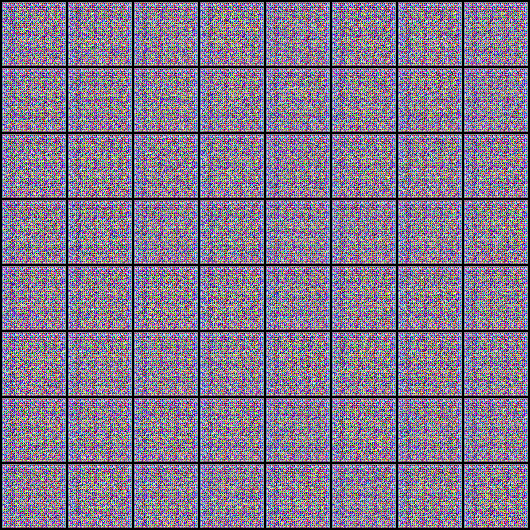

In [22]:
Image('./Photo2Cartoon_generated/generated-images-0001.png')

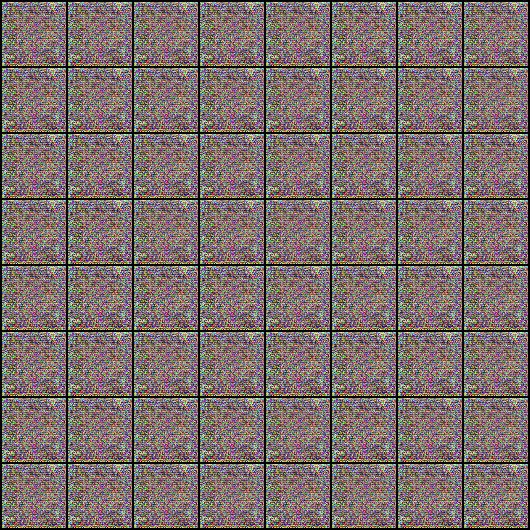

In [23]:
Image('./Photo2Cartoon_generated/generated-images-0050.png')

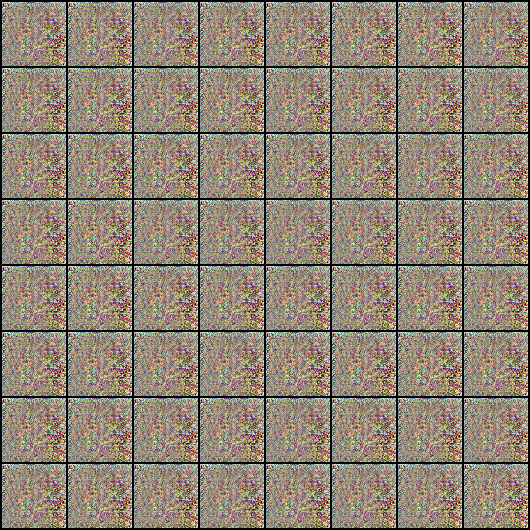

In [24]:
Image('./Photo2Cartoon_generated/generated-images-0100.png')

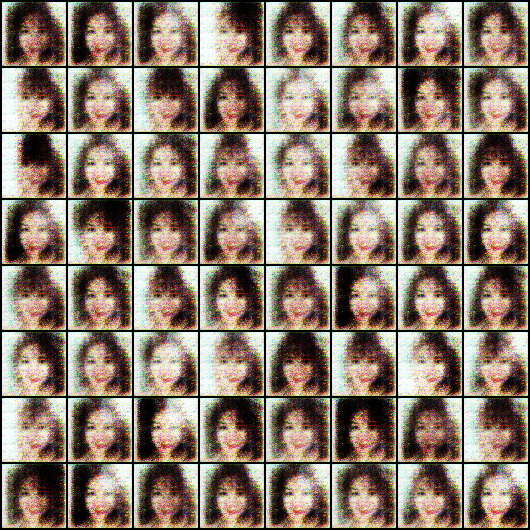

In [25]:
Image('./Photo2Cartoon_generated/generated-images-0150.png')

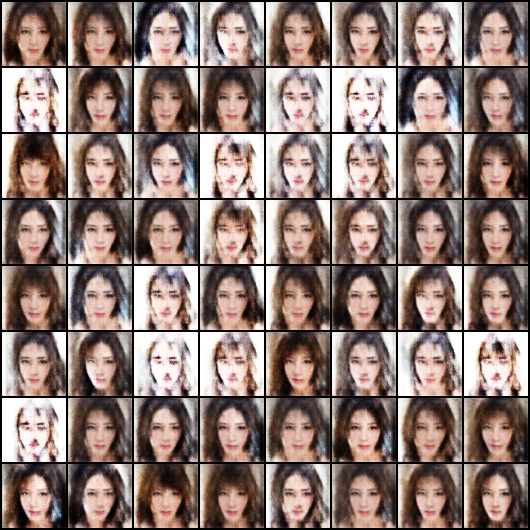

In [26]:
Image('./Photo2Cartoon_generated/generated-images-0200.png')

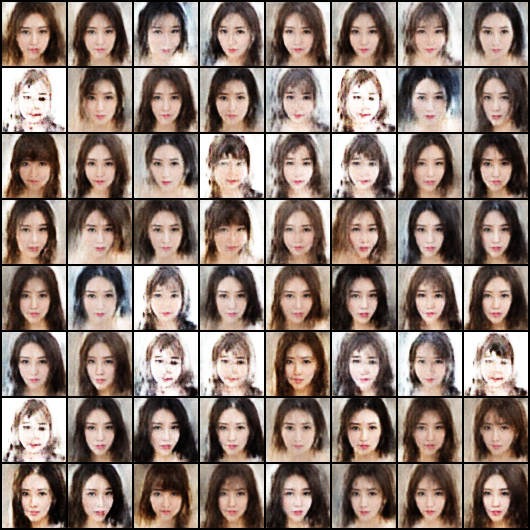

In [27]:
Image('./Photo2Cartoon_generated/generated-images-0250.png')

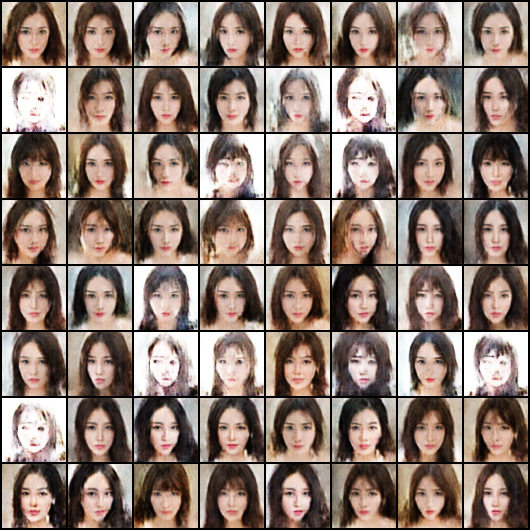

In [28]:
Image('./Photo2Cartoon_generated/generated-images-0300.png')

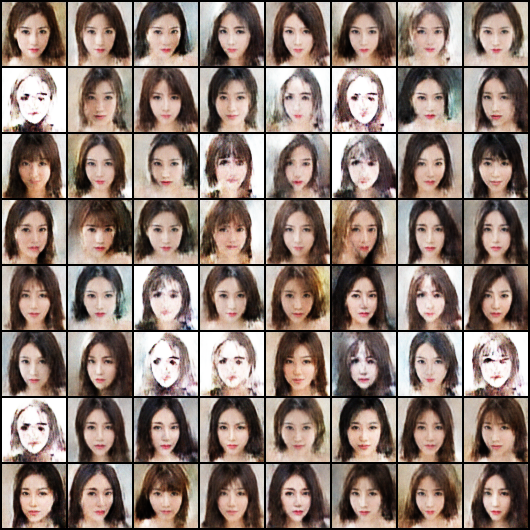

In [29]:
Image('./Photo2Cartoon_generated/generated-images-0350.png')

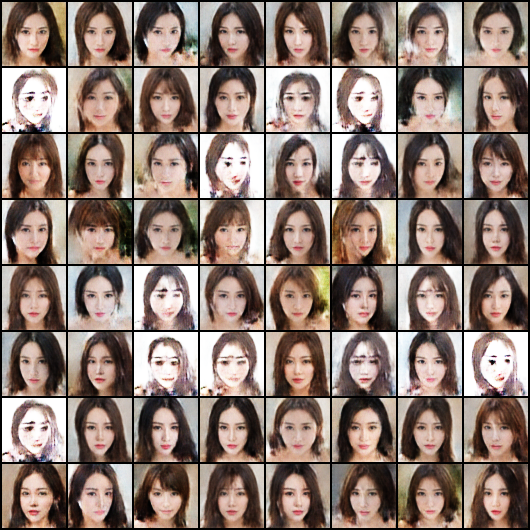

In [30]:
Image('./Photo2Cartoon_generated/generated-images-0500.png')

In [31]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'Photo2Cartoon_generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

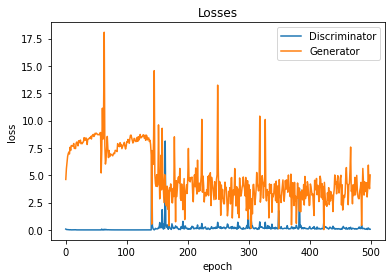

In [32]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

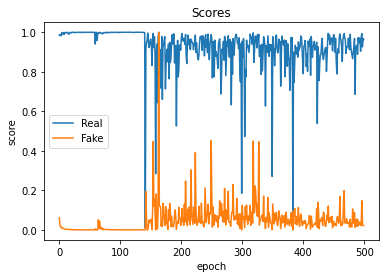

In [33]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');